# Chapter-04. 基于深度学习的目标检测算法

## 【章节目标】
- 掌握one-stage和two-stage检测器的区别
- 掌握one-stage检测器算法原理
- 掌握two-stage检测器算法原理
- 了解 Anchor-Free 检测器原理

## 【章节内容】
### 4.1 目标检测算法概览

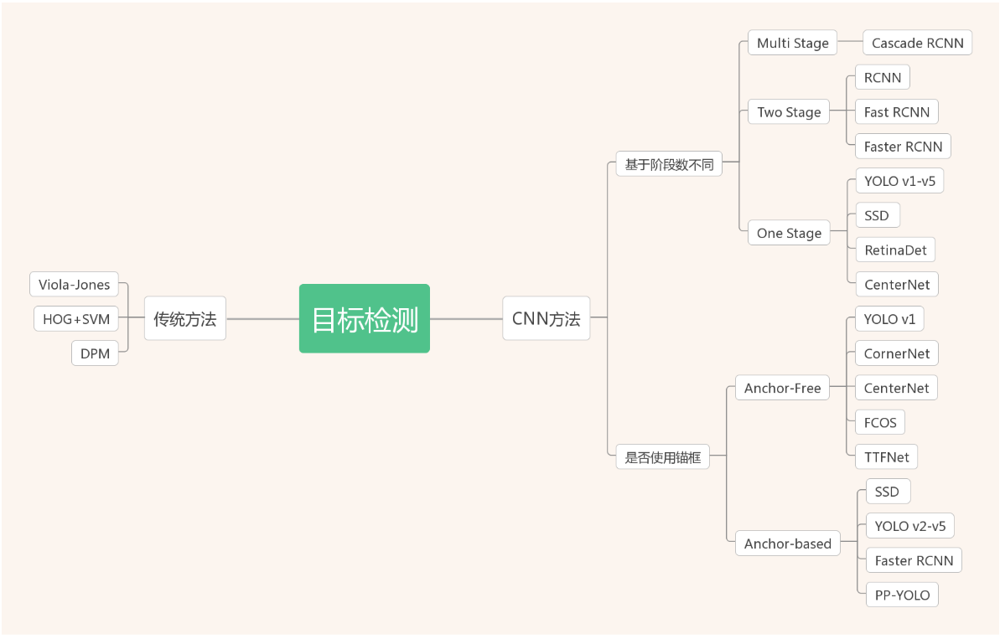

### 4.2 基于深度学习的目标检测算法概述
#### 4.2.1 发展论述
- 对于Overfeat、R-CNN方法，只是利用卷积神经网络进行特征提取，并没有改变搜索框提取目标区域的策略，算法的在速度上仍存在瓶颈。
- 随着Fast-RCNN的提出，通过RPN网络来代替原始的滑动窗口策略，标志着基于深度学习的目标检测方法，彻底完成了端到端的过程。使得速度和性能得到了很大的提升。后来不用提取候选框的策略，采用直接回归目标框位置的策略，例如：YOLO、SSD网络，进一步提高了目标检测算法的速度。

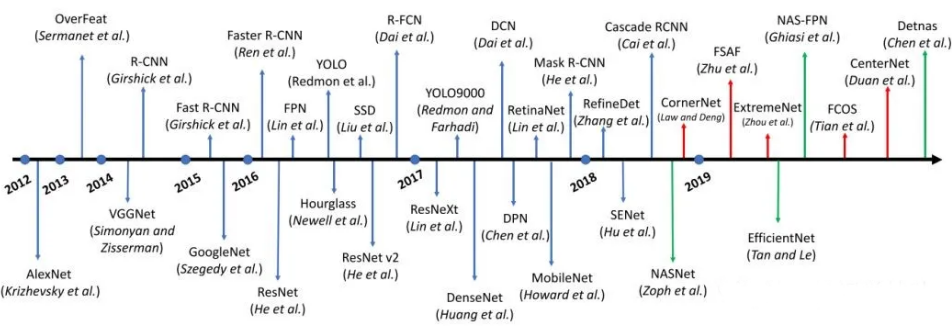

#### 4.2.2 Two-Stage和One-Stage
目标检测算法主要包括：

- 【Two-Stage】目标检测算法
- 【Multi-Stage】目标检测算法
- 【One-Stage】目标检测算法

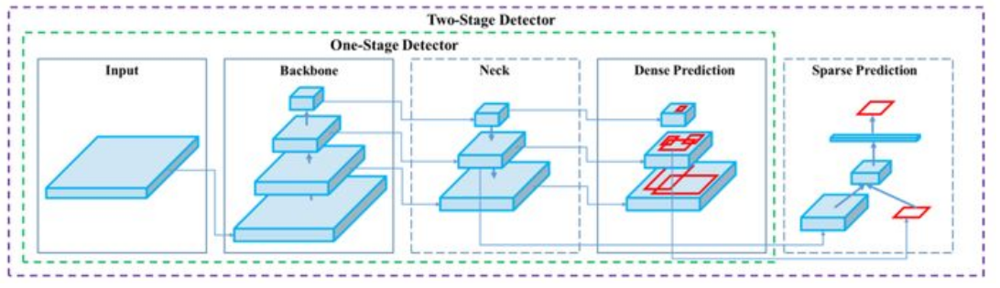

Two-stage Detectors  
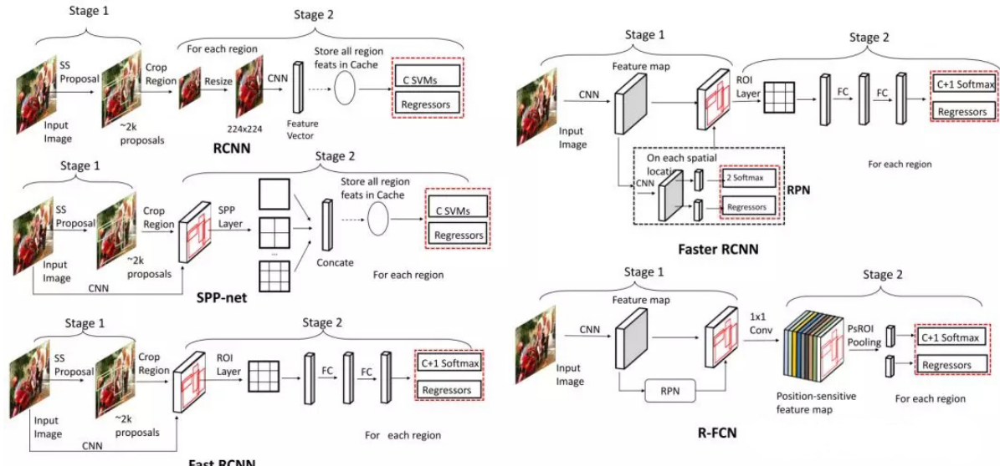  
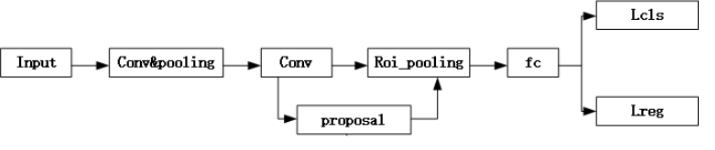  

One-stage Detectors  
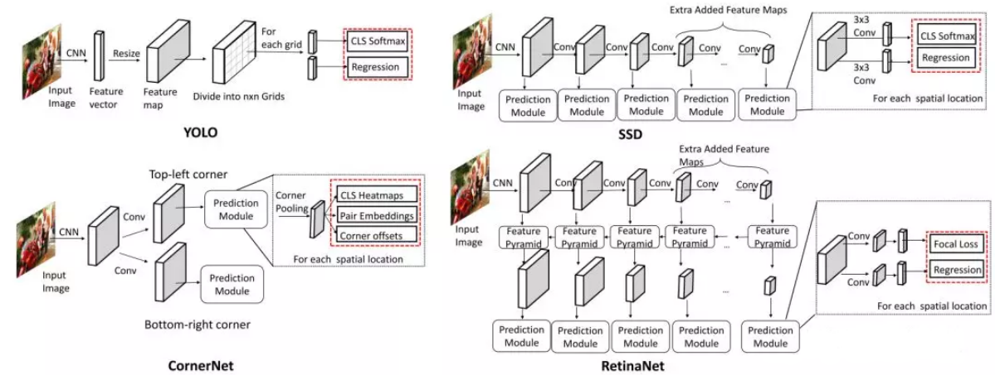  
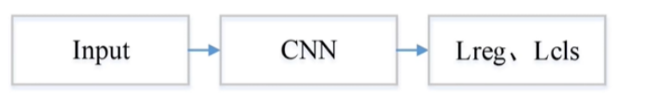

#### 4.2.3 Anchor-Free和Anchor-based
区别就在于有没有利用anchor提取候选目标框。

- anchor-based类算法代表是faster RCNN、SSD、Yolo V2/V3等。
- anchor-free类算法代表是CornerNet、CenterNet、FCOS等。

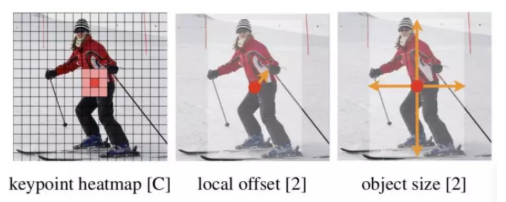  
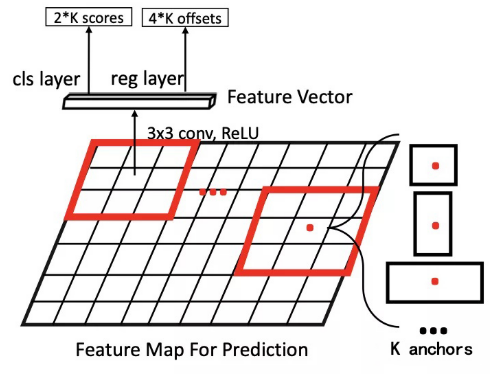

#### 4.2.4 Feature Representation Learning
- 图像金字塔:左上所示。训练多尺度检测器进行不同尺度的检测，这样保留的图像信息最为全面，但是囿于巨大的计算消耗，一般不用。
特征整合:左下图所示。如ION将不同层的特征通过RoIpooling进行裁剪融合，在预测中结合了多尺度的信息；这种用的不多了，一般现在都是多尺度预测，即- 使不是也不怎么会这样跨层直接融合（如STDN这样）。
- 预测金字塔:右上所示。最早是SSD中使用，后来还有MSCNN等使用，这种多尺度预测现在用的很多。
- 特征金字塔:经典的就是FPN了，针对FPN的变体十分多，思路大同小异，结果而言没有特别值得关注的新的点。

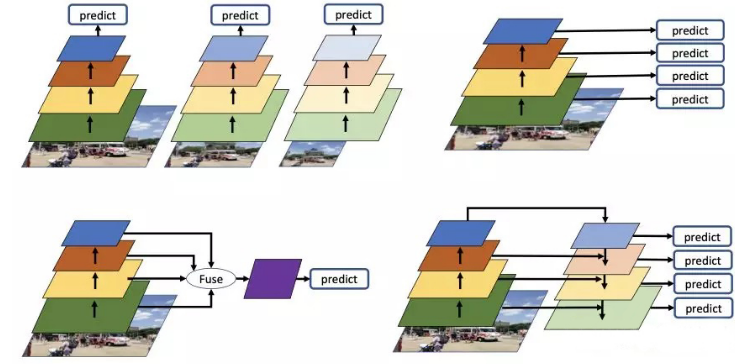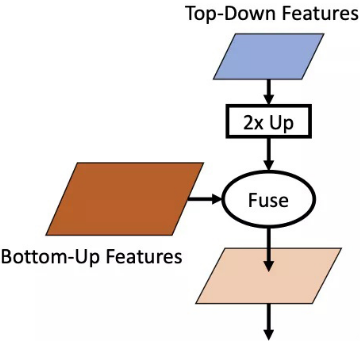

### 4.3 Two-stage Detectors(R-CNN系列)
#### 4.3.1 R-CNN
R-CNN 利用候选区域方法创建了约 2000 个 ROI。这些区域被转换为固定大小的图像，并分别馈送到卷积神经网络中（将原始图像根据ROI切割、reshape再送进NN学习）。该网络架构后面会跟几个全连接层，以实现目标分类并提炼边界框。

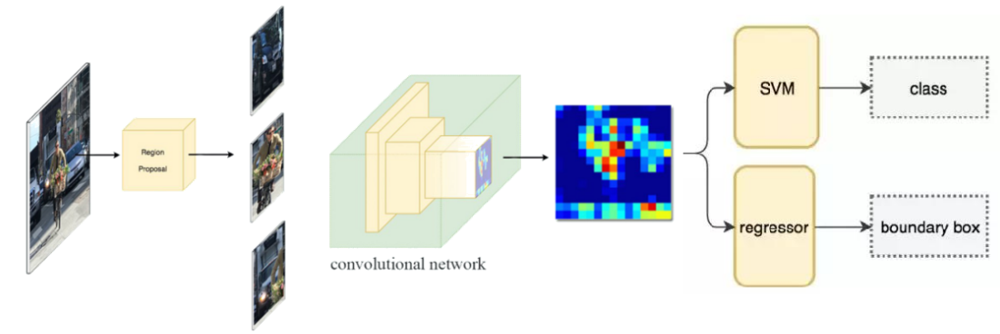

**R-CNN：Selective Search**

用候选区域方法（region proposal method）创建目标检测的感兴趣区域（ROI）。在选择性搜索（selective search）中，我们首先将每个像素作为一组。然后，计算每一组的纹理，并将两个最接近的组结合起来。但是为了避免单个区域吞噬其他区域，我们首先对较小的组进行分组。我们继续合并区域，直到所有区域都结合在一起。下图第一行展示了如何使区域增长，第二行中的蓝色矩形代表合并过程中所有可能的 ROI。

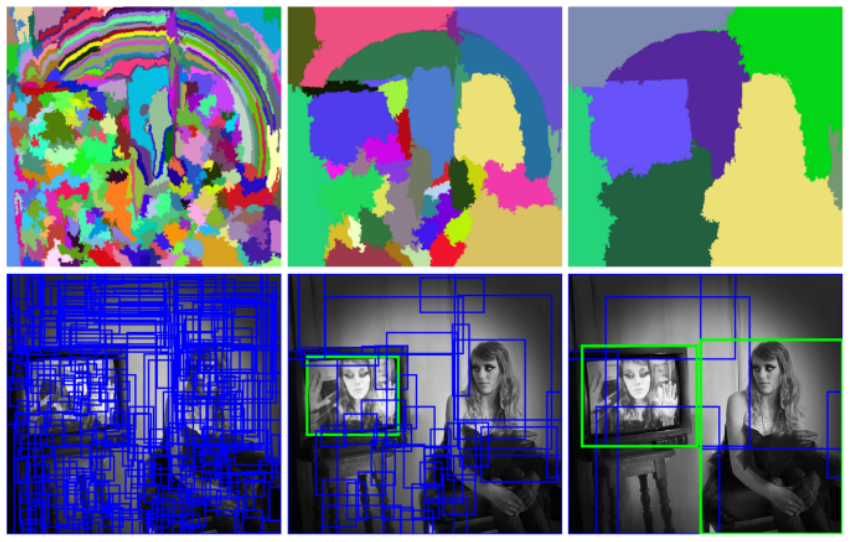

**R-CNN流程**

使用候选区域、CNN、仿射层来定位目标。以下是 R-CNN 整个系统的流程图：  
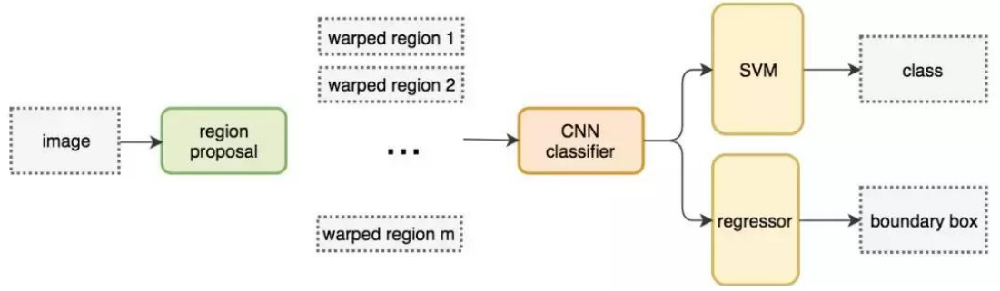  
> 通过使用更少且更高质量的 ROI，R-CNN 要比滑动窗口方法更快速、更准确。

**伪代码**

In [ ]:
ROIs = region_proposal(image)
for ROI in ROIs:
    patch = get_patch(image, ROI)
    results = detector(pach)

#### 4.3.2 Fast R-CNN
- Fast R-CNN 使用特征提取器（CNN）先提取整个图像的特征，而不是从头开始对每个图像块提取多次。然后，我们可以将提取的候选区域直接应用到提取到的特征图上来提取目标特征。
- 使用 ROI 池化将特征图块转换为固定的大小，并馈送到全连接层进行分类和定位。因为 Fast-RCNN 不会重复提取特征，因此它能显著地减少处理时间。

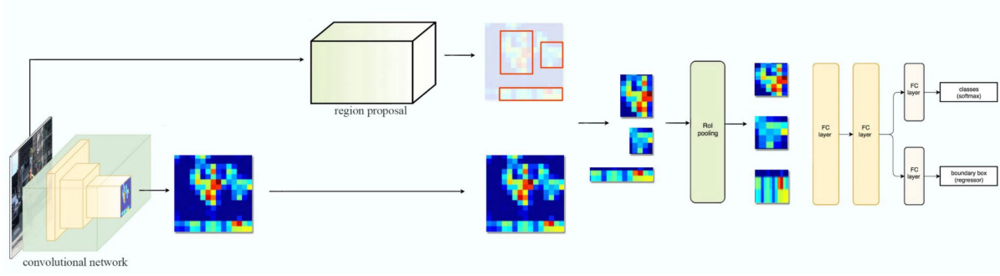

Fast R-CNN 的流程图：  
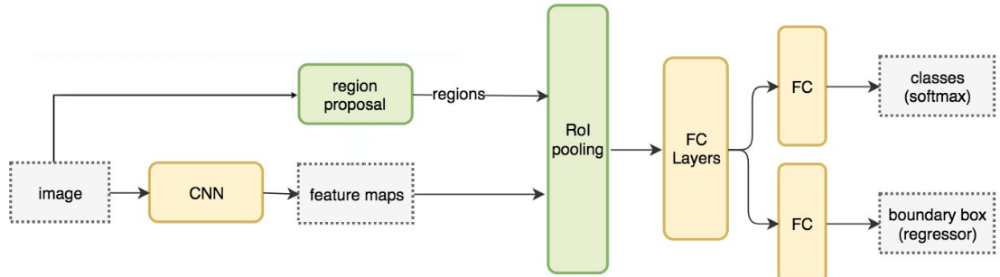

**伪代码**

In [ ]:
feature_maps = process(image)
ROIs = region_proposal(image)
for ROI in ROIs
    patch = roi_pooling(feature_maps, ROI)
    results = detector2(patch)

> 计算量巨大的特征提取过程从 For 循环中移出来了，因此速度得到显著提升 Fast R-CNN 的训练速度是 R-CNN 的 10 倍，推断速度是后者的 150 倍。

**ROI Pooling**

因为 Fast R-CNN 使用全连接层，所以我们用 ROI Pooling将不同大小的 ROI特征图转换为固定大小。

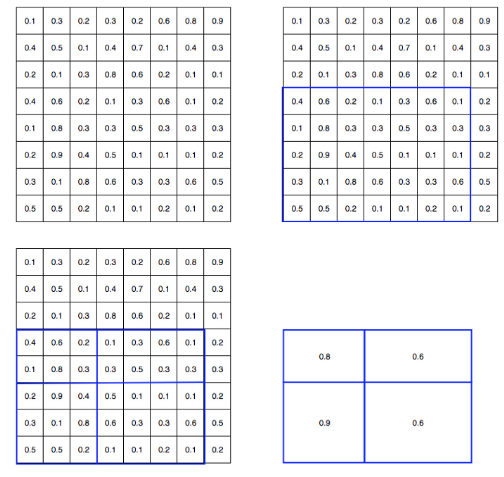

- 为简洁起见，我们先将 8×8 特征图转换为预定义的 2×2 大小。
- 左上角：特征图。
- 右上角：将 ROI（蓝色区域）与特征图重叠。
- 左下角：将 ROI 拆分为目标维度。例如，对于 2×2 目标，我们将 ROI 分割为 4 个大小相似或相等的部分。
- 右下角：找到每个部分的最大值，得到变换后的特征图。
- 最终得到一个 2×2 的特征图块，可以馈送至分类器和边界框回归器中

**Fast R-CNN缺点**

Fast R-CNN 依赖于外部候选区域方法，如选择性搜索。但这些算法在 CPU 上运行且速度很慢。在测试中，Fast R-CNN 需要 2.3 秒来进行预测，其中 2 秒用于生成 2000 个 ROI。

In [ ]:
feature_maps = process(image)
ROIs = region_proposal(image)   # Expensive!
for ROI in ROIs
    patch = roi_pooling(feature_maps, ROI)
    results = detector2(patch)

#### 4.3.3 Faster R-CNN
Faster R-CNN 采用与 Fast R-CNN 相同的设计，只是它用内部深层网络（RPN）代替了Selective Search方法。新的候选区域网络（RPN）在生成 ROI 时效率更高，并且以每幅图像 10 毫秒的速度运行。(可以在GPU上运行)

- Fast R-CNN

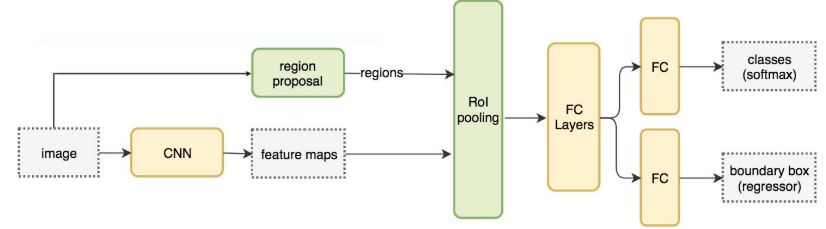

In [ ]:
feature_maps = process(image)
ROIs = region_proposal(feature_maps)
for ROI in ROIs
    patch = roi_pooling(feature_maps, ROI)
    results = detector2(patch)

- Faster R-CNN

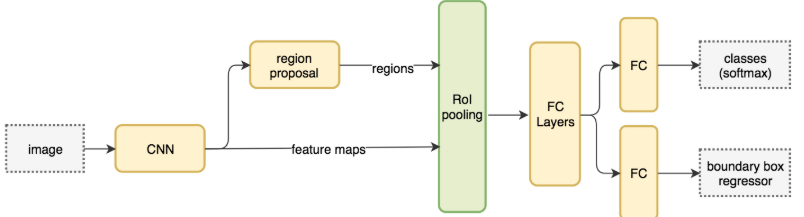

In [ ]:
feature_maps = process(image)
ROIs = region_proposal(feature_maps)
for ROI in ROIs
    patch = roi_pooling(feature_maps, ROI)
    results = detector2(patch)

**RPN**

Faster R-CNN用内部深层网络（RPN）代替了Selective Search方法。

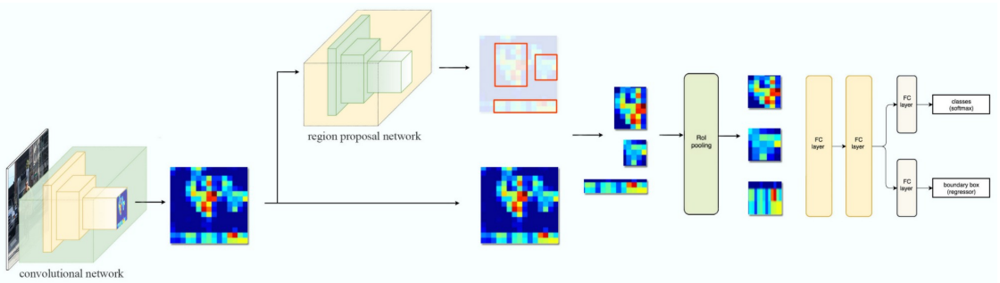  
> the external region proposal is replaced by an internal deep network

**Region proposal network**

- 候选区域网络（RPN）将第一个卷积网络的输出特征图作为输入。
- 使用只有两个类别的分类器：即带有目标的类别和不带有目标的类别。

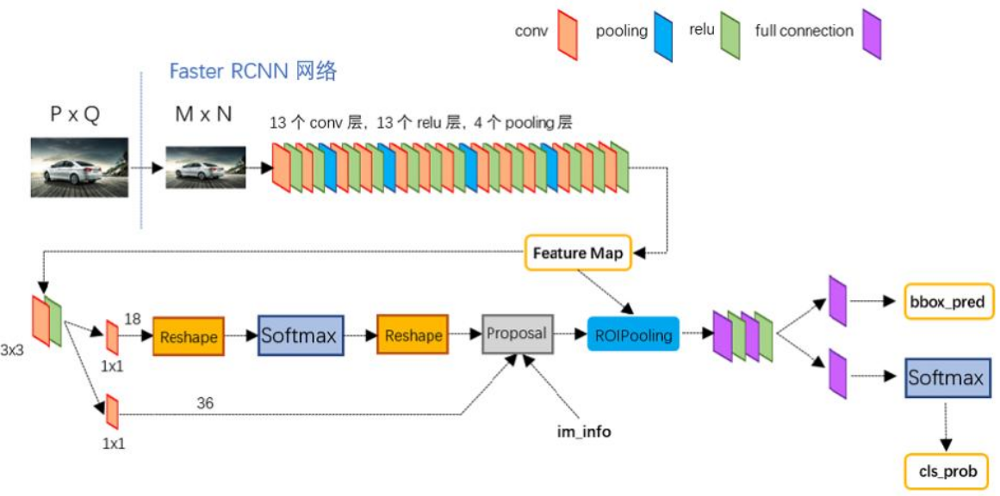  
> 对于特征图中的每一个位置，RPN 会做 k 次预测。因此，RPN 将输出 4×k 个坐标和每个位置上 2×k 个得分。

**anchors**

Faster R-CNN 不会创建随机边界框。相反，它会预测一些与其相关的anchors 左上角的偏移量（如x、y）

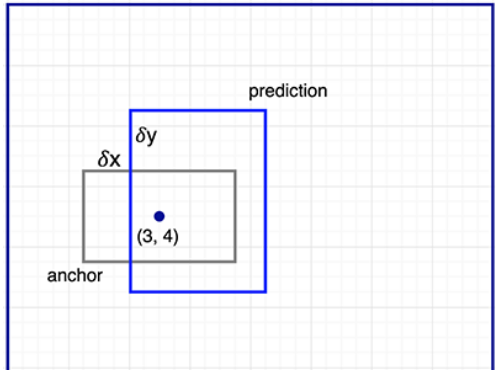

- 要对每个位置进行 k 个预测，我们需要以每个位置为中心的 k 个anchors。每个预测与特定anchor相关联，但不同位置共享相同的anchors形状。
- 这些anchors是精心挑选的，因此它们是多样的，且覆盖具有不同比例和宽高比的现实目标。

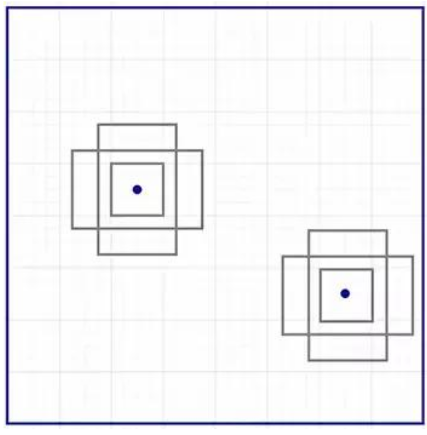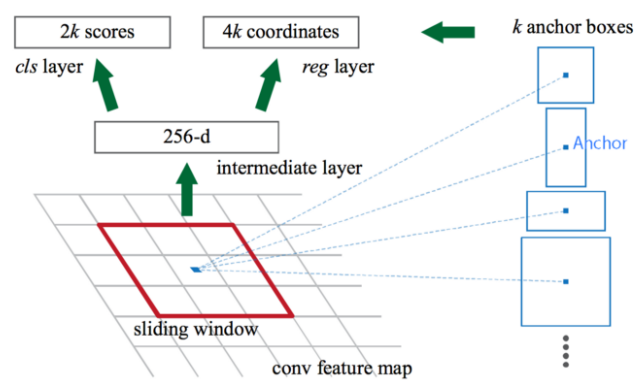

> Faster R-CNN 使用9 个anchors：3 个不同宽高比的 3 个不同大小的anchors。每一个位置使用 9 个anchors，每个位置会生成 2×9 个 objectness 分数和 4×9 个坐标。

#### 4.3.4 Cascade R-CNN

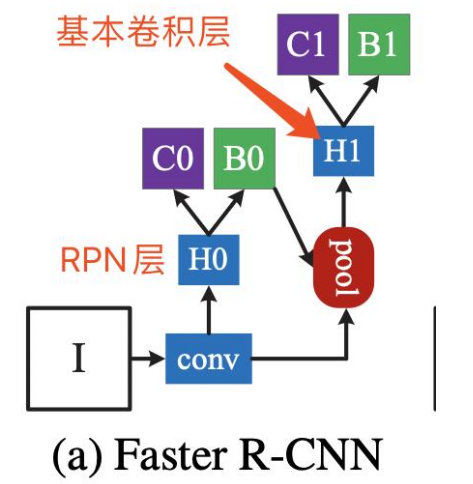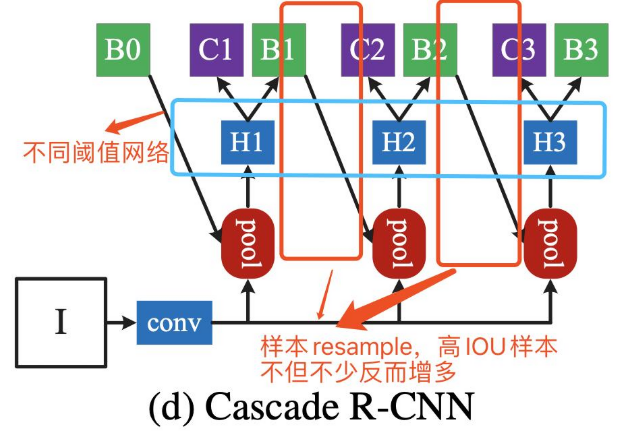

#### 4.3.5 R-CNN系列小结
- R-CNN：

In [ ]:
ROIs = region_proposal(image)
for ROI in ROIs:
    patch = get_patch(image, ROI)
    results = detector(pach)

- Fast R-CNN:

In [ ]:
feature_maps = process(image)
ROIs = region_proposal(image)
for ROI in ROIs
    patch = roi_pooling(feature_maps, ROI)
    results = detector2(patch)

- Faster R-CNN:

In [ ]:
feature_maps = process(image)
ROIs = region_proposal(feature_maps)
for ROI in ROIs
    patch = roi_pooling(feature_maps, ROI)
    results = detector2(patch)

### 4.4 One-Stage检测器
#### 4.4.1 为什么要One-Stage
Faster R-CNN 中，在分类器之后有一个专用的候选区域网络：

- 基于区域的检测器准确率高，但需要付出速度性能代价。Faster R-CNN 在 PASCAL VOC 2007 测试集上每秒处理 7 帧的图像（7 FPS）。
- 我们是否需要一个分离的候选区域步骤？我们可以直接在一个步骤内得到边界框和类别吗？

In [ ]:
feature_maps = process(image)
results = detector3(feature_maps) # No more separate step for ROIs

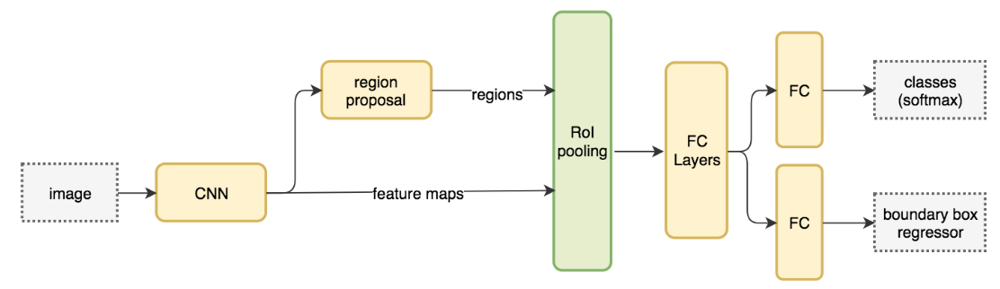

**滑动窗口思想**

- 参考滑动窗口检测器，我们可以通过在特征图（feature_maps）上滑动窗口来检测目标。
- 对于不同的目标形状，我们使用不同的窗口形状。这就需要非常多的形状来覆盖大部分目标。
- 更有效的方法是将窗口形状作为先验知识，然后回归预测物体基于先验框（anchors）的偏移量。

---

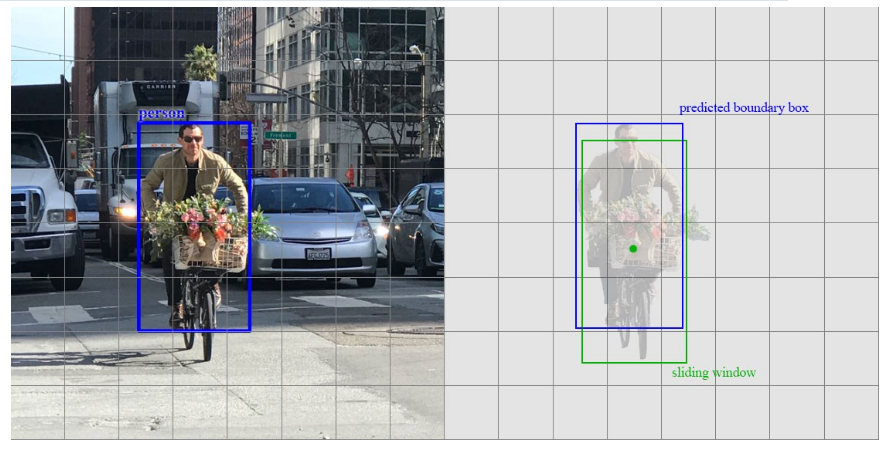


#### 4.4.2 Yolo v1
- Resize成448*448，图片分割得到7*7网格(cell)
- CNN提取特征和预测：卷积部分负责提特征。全链接部分负责预测：  
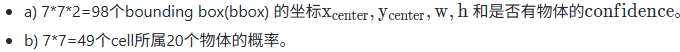
- 过滤bbox（通过nms）  
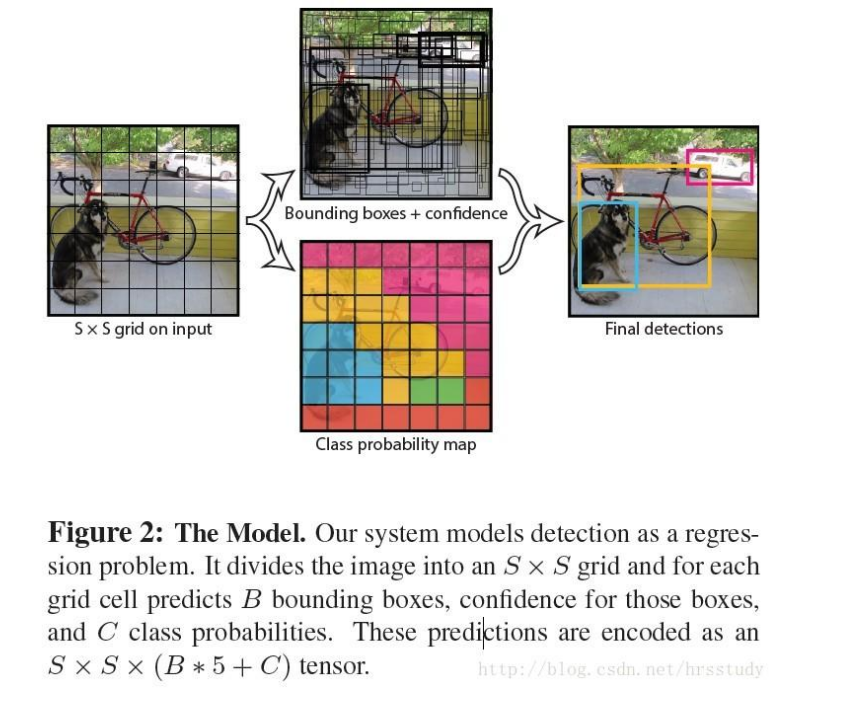

**Yolo v1网络结构**

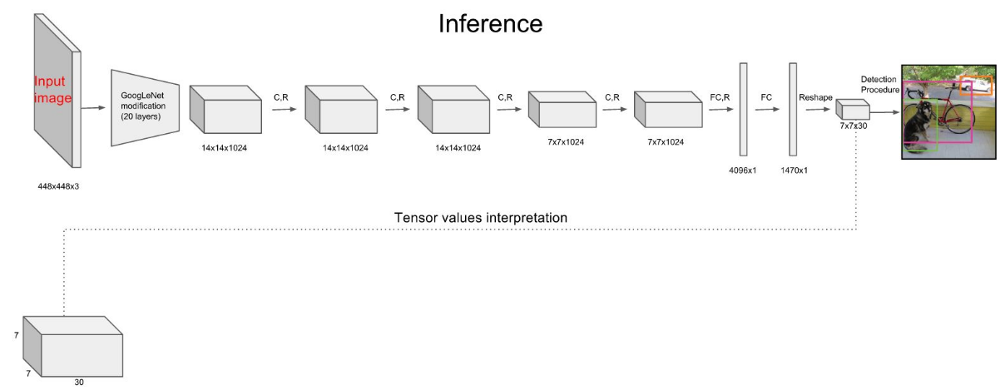

**输出的30维向量包含的信息**

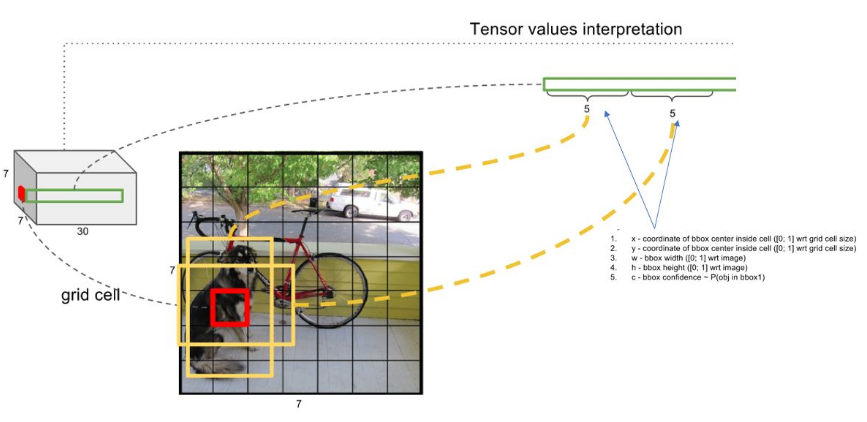

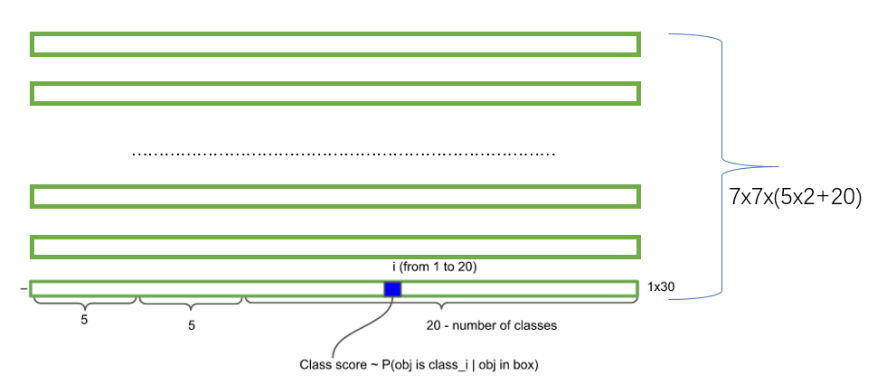

**损失计算**

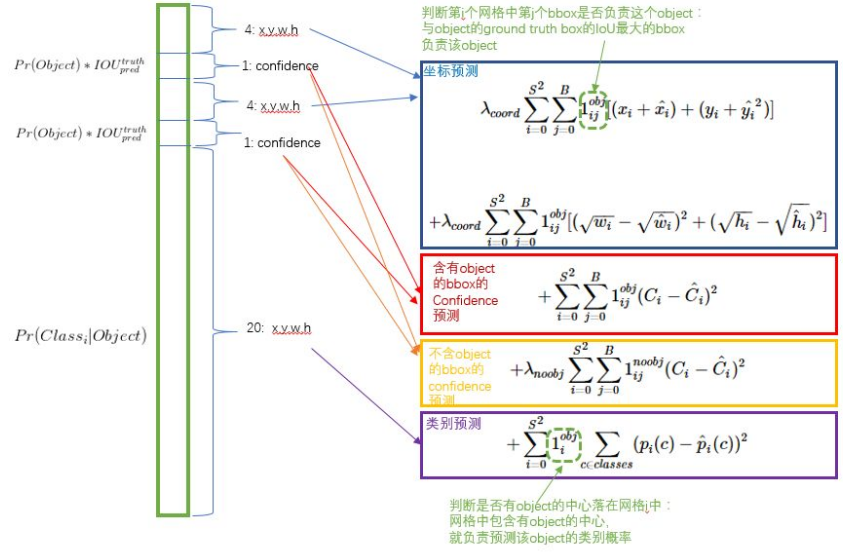

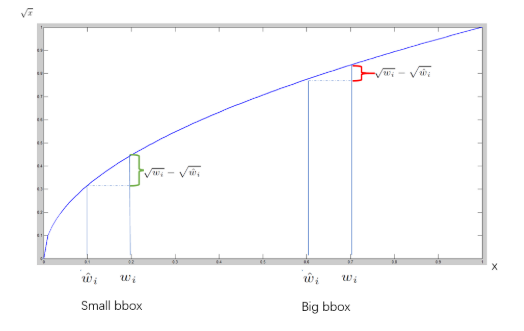  
> 相比于大bbox预测偏一点，小box预测偏一点更不能忍受

**Yolo v1 缺点**

- YOLO对相互靠的很近的物体（挨在一起且中点都落在同一个格子上的情况），还有很小的物体检测效果不好，这是因为一个网格中只预测了两个框，并且只属-于一类。
- 测试图像中，当同一类物体出现的不常见的长宽比和其他情况时泛化能力偏弱。
- 由于损失函数的问题，定位误差是影响检测效果的主要原因，尤其是大小物体的处理上，还有待加强。

#### ***4.4.3 SSD(Single Shot MultiBox Detector)
- SSD 是使用 VGG19 网络作为特征提取器（和 Faster R-CNN 中使用的 CNN 一样）的单次检测器。并在其后添加自定义卷积层（蓝色），并使用卷积核（绿色）执行预测。
- 卷积层降低了空间维度和分辨率，因此上述模型仅可以检测较大的目标。为了解决该问题，我们从多个特征图上执行独立的目标检测。采用多尺度特征图独立检测。

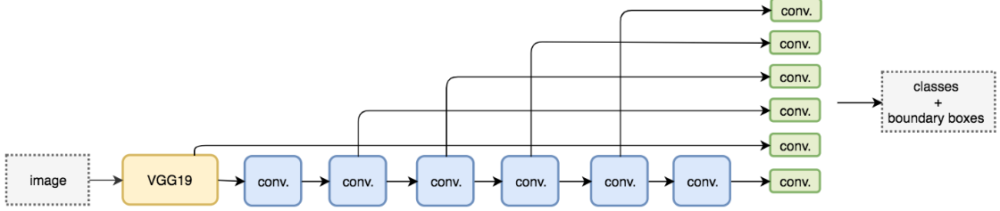

**网络架构**

- SSD网络主体设计的思想是特征分层提取，并依次进行边框回归和分类
- SSD网络中分为了6个stage，每个stage能学习到一个特征图，然后进行边框回归和分类。
骨干网络：SSD前面的骨干网络选用的VGG16的基础网络结构，如上图所示，虚线框内的是VGG16的前5层网络。然后后面的Conv6和Conv7是将VGG16的后两层- 全连接层网络(fc6, fc7)转换而来。在此基础上，SSD网络继续增加了Conv8和Conv9、Conv10和Conv11四层网络。

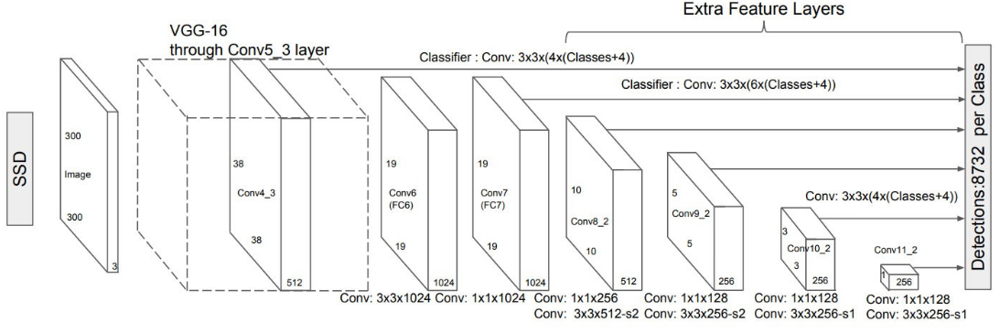

**Default Boxes生成**

- 在SSD中，作者充分的吸取了Faster R-CNN中的Anchors机制，在每个Stage中根据Feature Map的大小，按照固定的Scale和Radio生成Default Boxes。
- 38x38x4+19x19x6+10x10x6+5x5x6+3x3x4+1x1x4=8732个Default Boxes

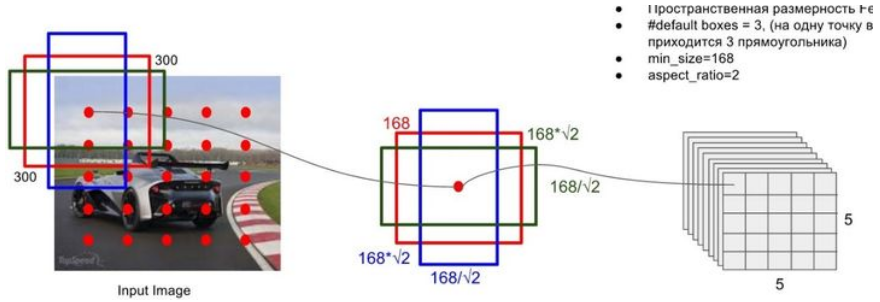
> 为了方便阐述，选取了Conv9的Feature Map，输出大小为5x5。SSD网络中作者设置Conv9的每个点默认生成6个box，如图所示。因此在这一层上，共生成了5x5x6=150个boxes。

**预测输出**

- SSD预测网络会为每个Default Box输出一个相应的预测向量，用来进行边框回归和分类。
- 边框回归：4维
- 类别预测：C+1（C为类别数，1为背景）

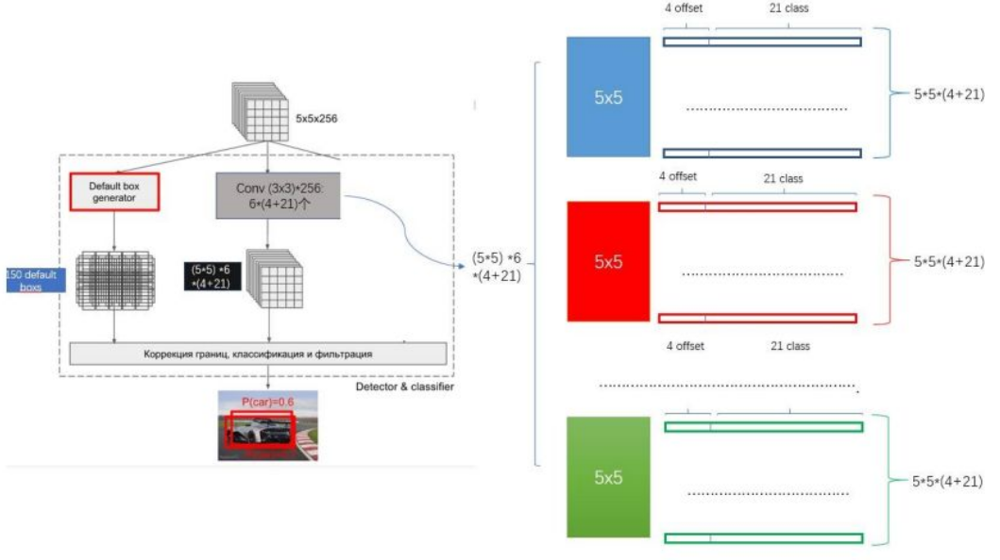

**损失计算**

SSD网络对于每个Stage输出的特征图都进行边框回归和分类操作。SSD网络中作者设计了一个联合损失函数。

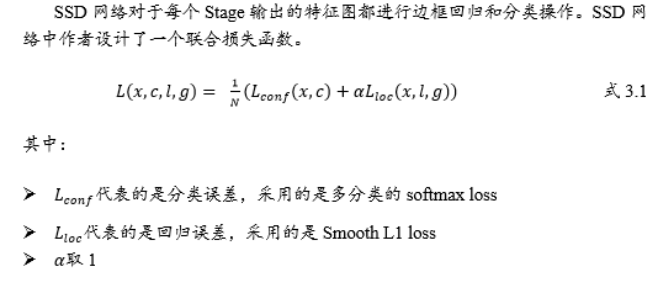

**训练策略**

训练SSD和基于region proposal方法的最大区别就是：SSD需要精确的将ground truth映射到输出结果上。这样才能提高检测的准确率。文中主要采取了以下几个技巧来提高检测的准确度。

- 匹配策略
- Default boxes生成器
- Hard Negative Mining
- Data Augmentation

**训练策略**

训练SSD和基于region proposal方法的最大区别就是：SSD需要精确的将ground truth映射到输出结果上。这样才能提高检测的准确率。文中主要采取了以下几个技巧来提高检测的准确度。

- 匹配策略
- Default boxes生成器
- Hard Negative Mining
- Data Augmentation

**训练策略-匹配策略**

每个特征图上生成的Default boxes都需要使用ground truth进行匹配（Default boxes是采样样本，ground truth匹配进行打标签），主要分为两步：

- 第一步是根据最大的overlap将ground truth和default box进行匹配(根据ground truth找到default box中IOU最大的作为正样本)，保证ground truth一定有匹配的default box
- 第二步是将default boxes与overlap大于某个阈值的ground truth进行匹配。
    - 如果default box与ground truth的IoU>0.7，标记为正样本，label=1
    - 如果default box与ground truth的IoU<0.3，标记为负样本，label=0
    - 剩下的既不是正样本也不是负样本，不用于最终训练，label=-1
- 结论：一个ground truth可以和多个default box匹配，一个default box只能匹配一个ground truth

**训练策略-Default boxes生成器规则**

- 以feature map上每个点的中点为中心（offset=0.5），生成一系列同心的Defalut box（然后中心点的坐标会乘以step，相当于从feature map位置映射回原图位置）
- 使用m(SSD300中m=6)个不同大小的feature map 来做预测，最底层的 feature map 的 scale 值为 Smin=0.2，最高层的为
Smax=0.95，其他层通过下面的公式计算得到：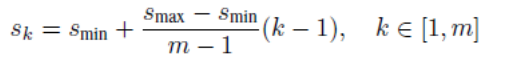
- 使用不同的ratio值，[1, 2, 3, 1/2, 1/3]，通过下面的公式计算 default box 的宽度w和高度h  
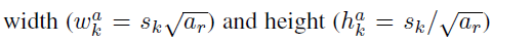
- 而对于ratio=0的情况，指定的scale如下所示，即总共有 6 中不同的 default box。  
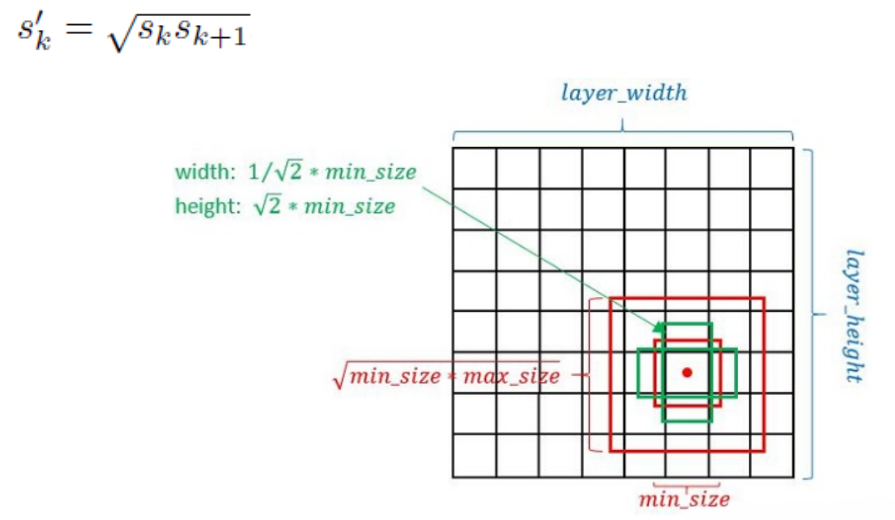

**训练策略-Hard Negative Mining**

- 经过匹配策略会得到大量的负样本，只有少量的正样本。这样导致了正负样本不平衡，经过试验表明，正负样本的不均衡是导致检测正确率低下的一个重要原因。
- 训练过程中采用了online Hard Negative Mining的策略，根据Confidence Loss对所有的box进行排序（选取loss比较大的box作为负样本），使得正负样本的比例控制在1:3之内，经过作者实验，这样做能提高4%左右的准确度。

**训练策略-Data Augmentation**

- 为了模型更加鲁棒，需要使用不同尺度目标的输入，作者对数据进行了增强处理。
- 使用整张图像作为输入
- 使用IOU和目标物体为0.1、0.3、0.5、0.7和0.9的patch，这些patch在原图的大小的[0.1, 1]之间，相应的宽高比在[1/2, 2]之间。
- 随机采取一个patch，每个patch被resize到固定大小，并且以0.5的概率进行随机水平翻转

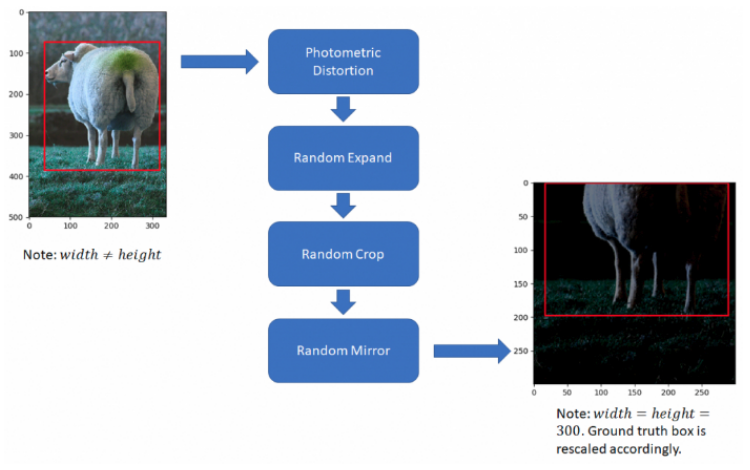

**基于SSD改进的一些算法**

- DSSD
- DSOD
- FSSD
- RSSD

**DSSD**

- SSD对于小目标不够鲁棒的最主要原因是浅层feature map的表征能力不够强。如何解决？
- 使用反卷积层（deconvolution layer ）增加了大量上下文信息。
- 更好的基础网络（ResNet-101）和Deconvlution层，skip连接起来给浅层feature map更好的表征能力

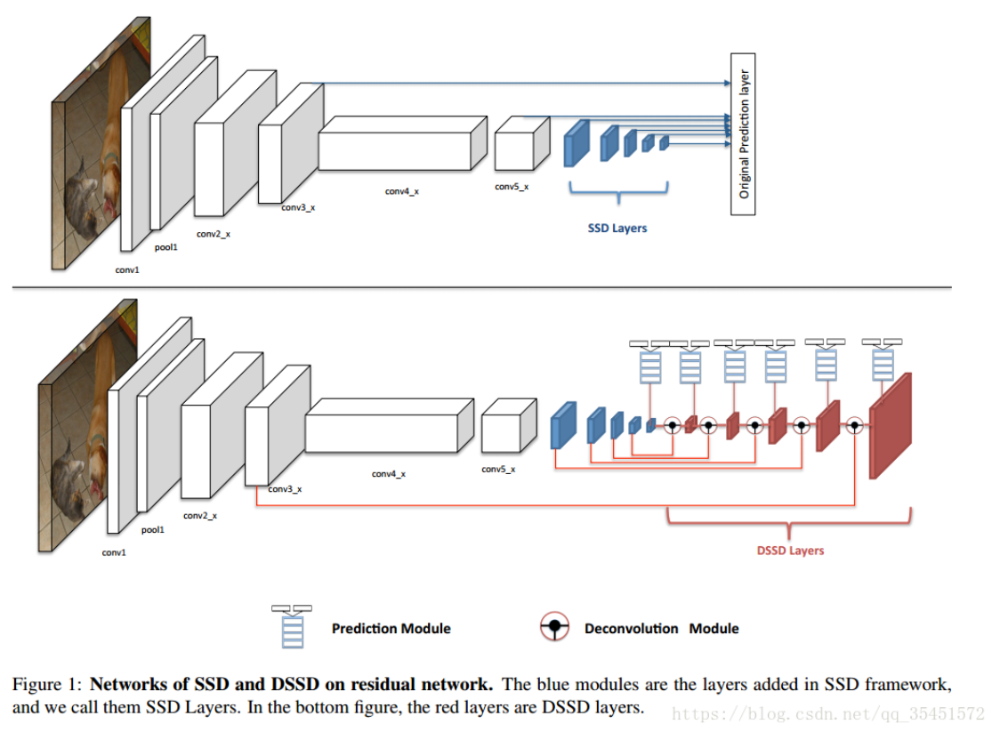

DSOD DSOD是在SSD的基础上发展而来的，DSOD的不同在于，不管是在backbong还是head部分，DSOD都借鉴了DenseNet的设计思想。

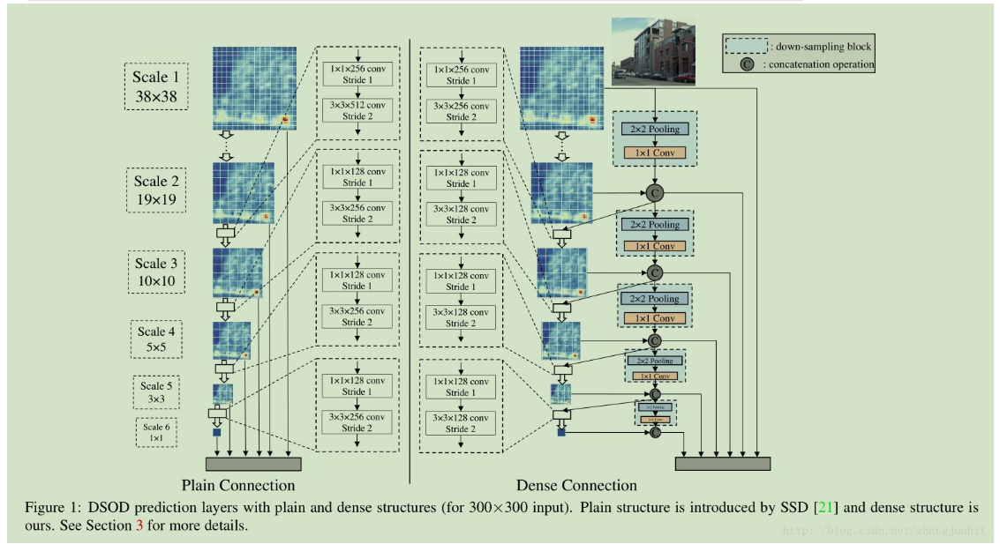

#### 4.4.4 Feature Pyramid Networks (FPN)
- 检测不同尺度的目标很有挑战性，尤其是小目标的检测。
- 特征金字塔网络（FPN）是一种旨在提高准确率和速度的特征提取器。它取代了检测器（如 Faster R-CNN）中的特征提取器，并生成更高质量的特征图金字塔。

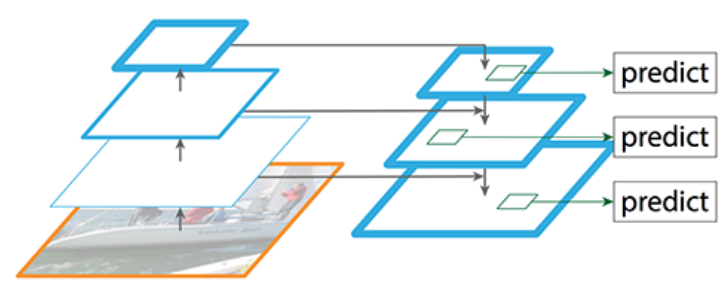

**Feature Pyramid Networks (FPN)**

- FPN 由自下而上和自上而下路径组成。其中自下而上的路径是用于特征提取的常用卷积网络。空间分辨率自下而上地下降。当检测到更高层的结构，每层的语义值增加。
- SSD 通过多个特征图完成检测。但是，最底层的分辨率高但是语义值不够，导致速度显著下降而不能被使用。SSD 只使用较上层执行目标检测，因此对于小的物体的检测性能较差。

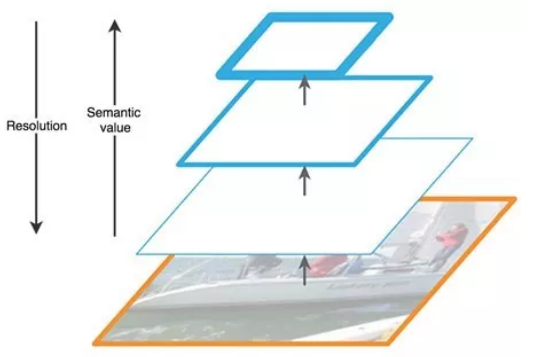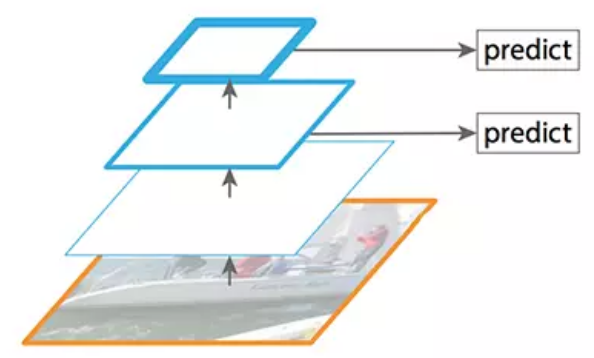

**增加跳过连接**

- FPN 提供了一条自上而下的路径，从语义丰富的层构建高分辨率的层。
- 虽然该重建层的语义较强，但在经过所有的上采样和下采样之后，目标的位置不精确。在重建层和相应的特征图之间添加横向连接可以使位置侦测更加准确。

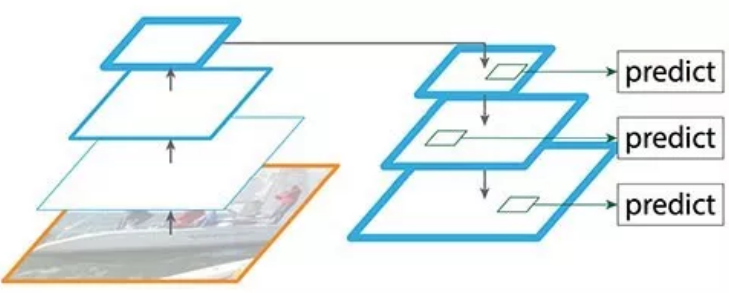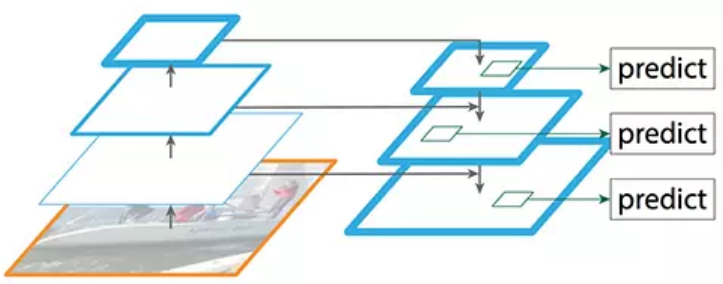

> 自上而下重建空间分辨率,图中详细说明了自下而上和自上而下的路径。

其中 P2、P3、P4 和 P5 是用于目标检测的特征图金字塔。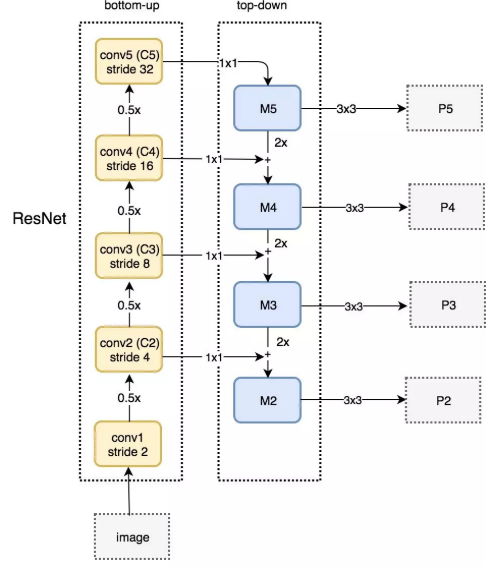

**FPN结合RPN**

FPN 不单纯是目标检测器，还是一个和目标检测器协同工作的特征检测器。将每个特征图 (P2 to P5)分别喂给预测网络进行预测

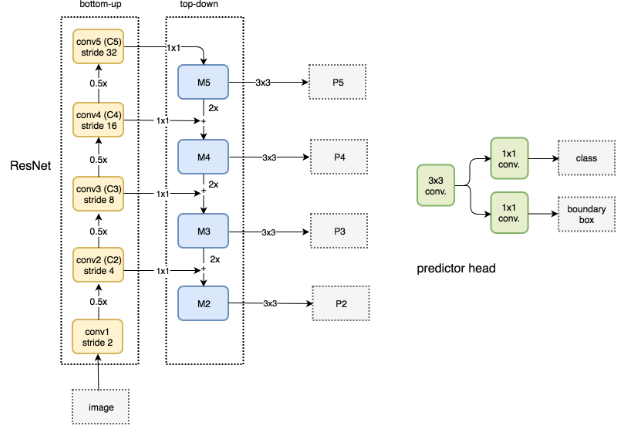

**FPN结合Fast R-CNN 或者 Faster R-CNN**

在 FPN 中，我们生成了一个特征图的金字塔。用 RPN来生成 ROI。基于 ROI 的大小，我们选择最合适尺寸的特征图层来提取特征块。

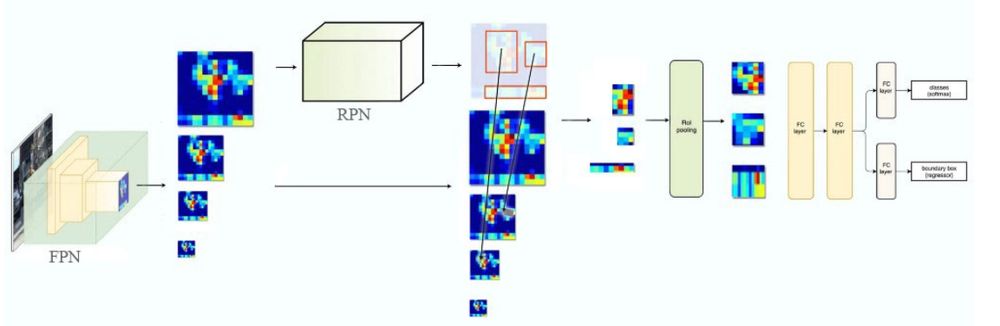

#### 4.4.5 YOLO v2

YOLOv2相对v1版本，在继续保持处理速度的基础上，从预测更准确（Better），速度更快（Faster），识别对象更多（Stronger）这三个方面进行了改进。其中识别更多对象也就是扩展到能够检测9000种不同对象，称之为YOLO9000。

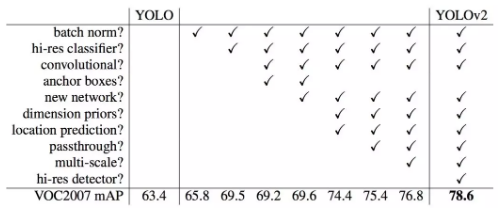

**YOLO v2：预测更准确（Better）**

- batch normalization（批归一化）
- 使用高分辨率图像微调分类模型：YOLO2在采用 224*224 图像进行分类模型预训练后，再采用 448*448 的高分辨率样本对分类模型进行微调
- 采用先验框（Anchor Boxes）：借鉴Faster RCNN的做法，YOLO2也尝试采用先验框（anchor）。
- 聚类提取先验框尺度
- 多尺度图像训练：因为去掉了全连接层，YOLO2可以输入任何尺寸的图像。

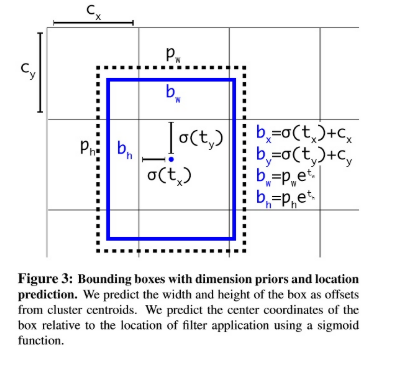

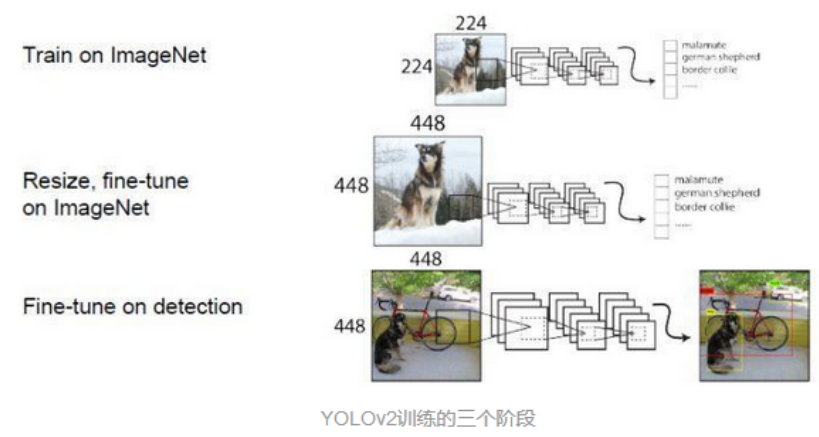

**YOLO v2：速度更快（Faster）**

为了进一步提升速度，YOLO2提出了Darknet-19（有19个卷积层和5个MaxPooling层）网络结构。DarkNet-19比VGG-16小一些，精度不弱于VGG-16，但浮点运算量减少到约1/5，以保证更快的运算速度。

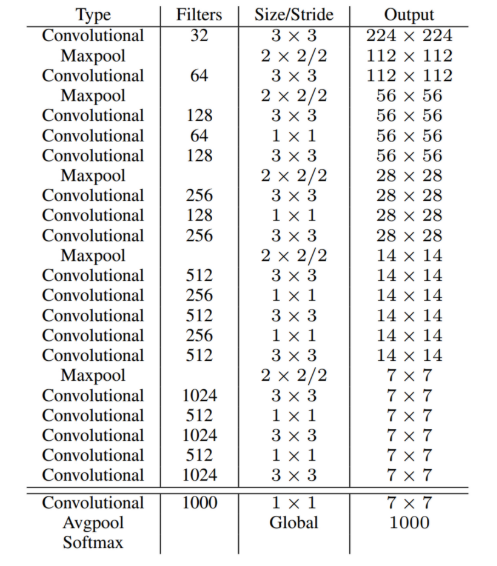

#### ***4.4.6 YOLO v3
- YOLOV3是前几个版本同一个作者，在18年做的一次改进。
- 网络结构变化:网络使用连续的3×3和1×1卷积层，有53个卷积层，称之为 Darknet-53

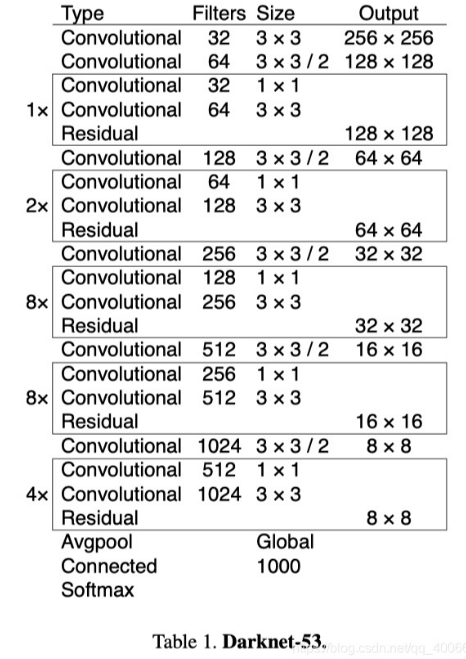

- 特征金字塔(FPN网络)
- 逻辑回归替代softmax作为分类器

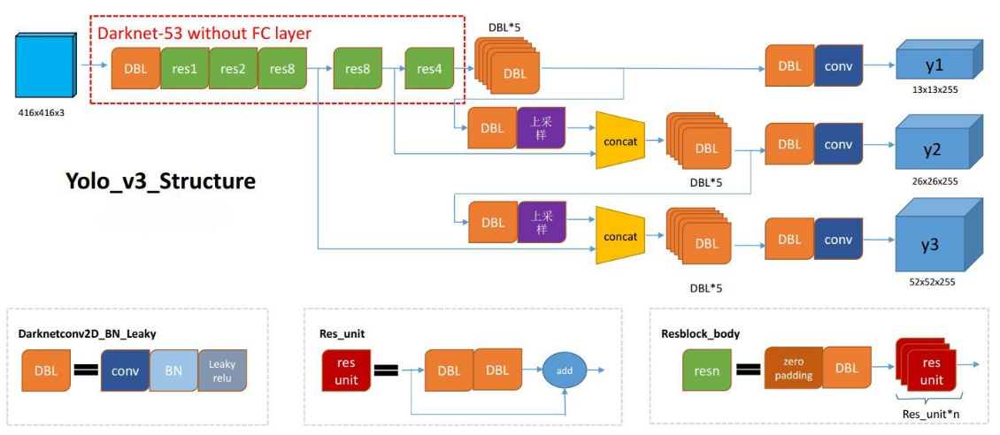

> N×N×[3×(4+1+80)]

#### 4.4.7 Focal Loss（RetinaNet）
- 类别不平衡会损害性能。
- SSD 在训练期间重新采样目标类和背景类的比率，这样它就不会被图像背景淹没。
- Focal loss（FL）采用另一种方法来减少训练良好的样本的损失。

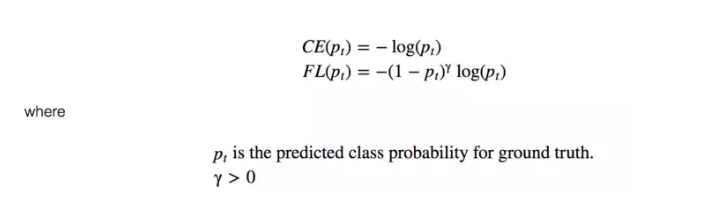

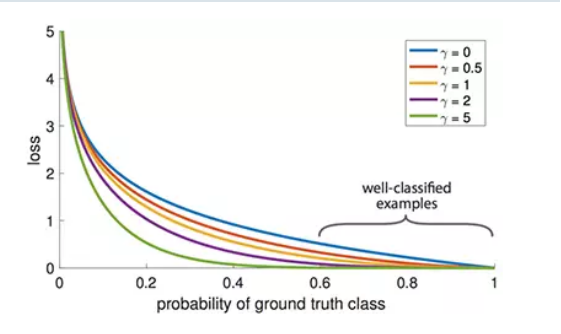

**RetinaNet网络结构**

基于 FPN、ResNet 以及利用 Focal loss 构建的 RetianNet

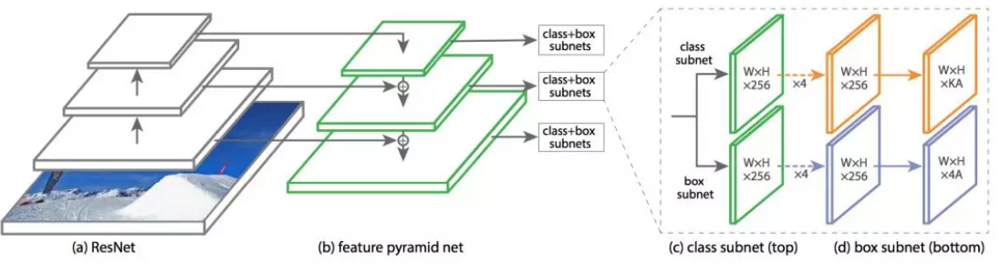

### 4.5 Anchor-Free检测器
#### 4.5.1 代表性的Anchor-Free检测器
- YOLO v1
- CornerNet
- CenterNet
- FCOS

#### 4.5.2 YOLO v1
- 两个框预测一个类别
- SSD每个框预测一个类别

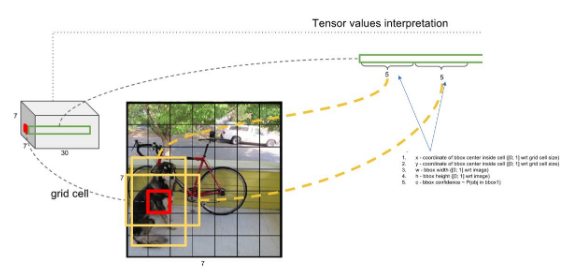

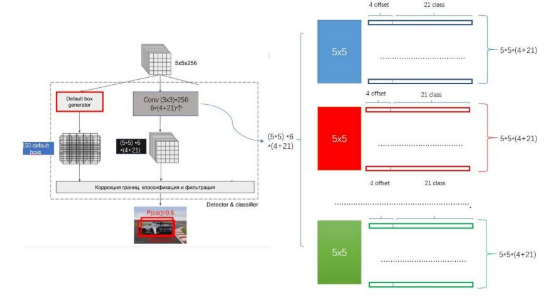

#### 4.5.3 CornerNet
- 通过检测bbox的一对角点来检测出目标。
- 提出corner pooling，来更好的定位bbox的角点。

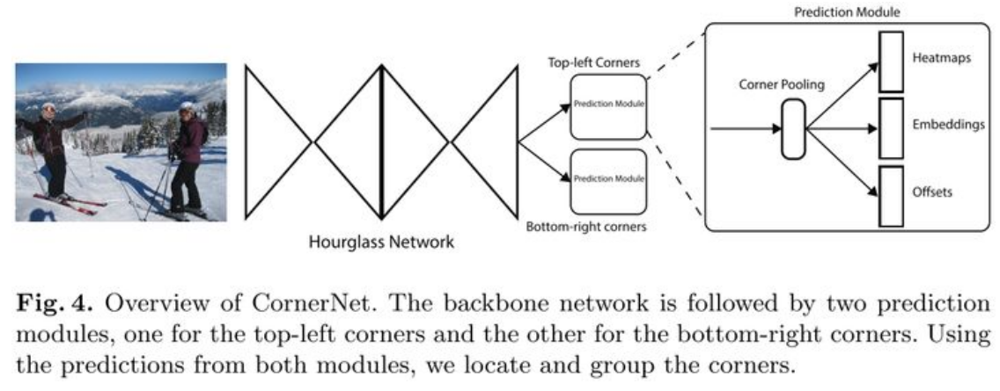

**CornerNet**

- 首先预测出两组heatmaps，一组为top-left角点，另一组为bottom-right角点。
- 每组heatmaps有C个通道，表示C个类别，尺寸为HxW。每个通道是一个binary mask，表示一个类的角点位置。
- 受到多人姿态估计论文的启发，基于角点embedding之间的距离来对角点进行分组。

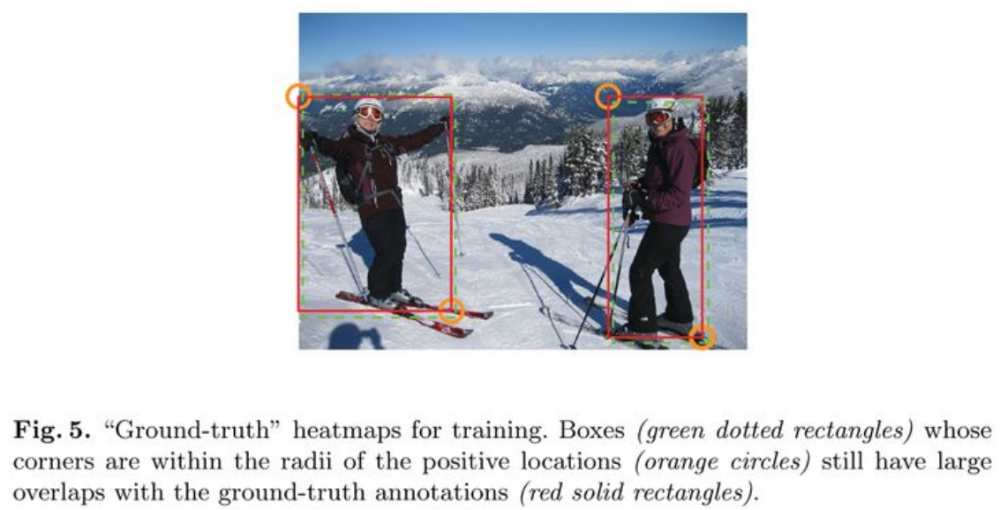

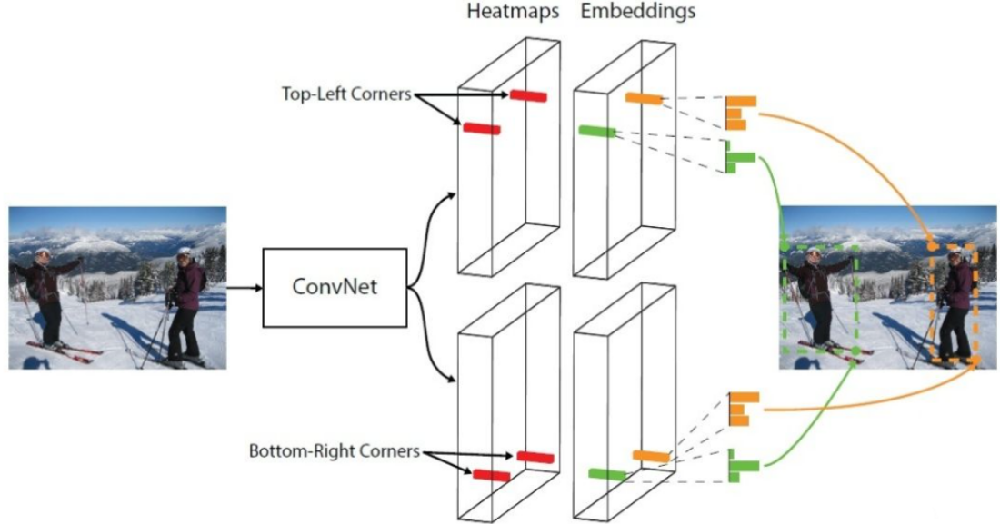
> 训练时，以正例位置为圆心，设置半径为r的范围内，减少负例位置的惩罚(采用二维高斯的形式)

**Corner Pooling**

在每个pixel位置，最大池化第一个feature map右方的所有特征向量，最大池第二个feature map下方的所有特征向量，然后将两个池化结果相加。

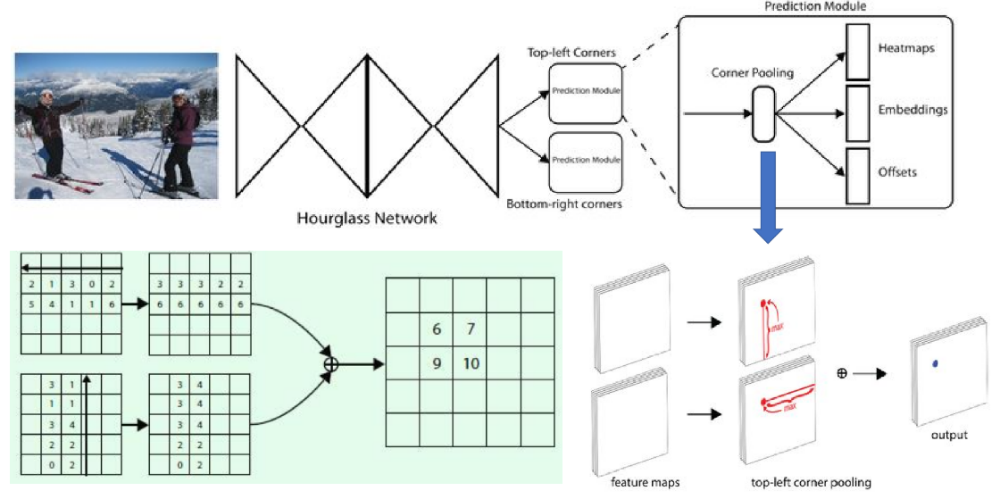

#### 4.5.4 CenterNet
- 使用Cascade Corner Pooling模块提取图像的Corner heatmaps，并采用与CornerNet中一样的方法，根据左上角和右下角点，得到物体的bounding box
- 使用Center Pooling模块，提取图像的Center heatmap，根据Center map的到所有的物体中心点，无需nms后处理
- 使用物体中心点对2）中提取到的bounding box进行进一步过滤，如果box的中间区域没有中心点存在，则认为此box不可靠。

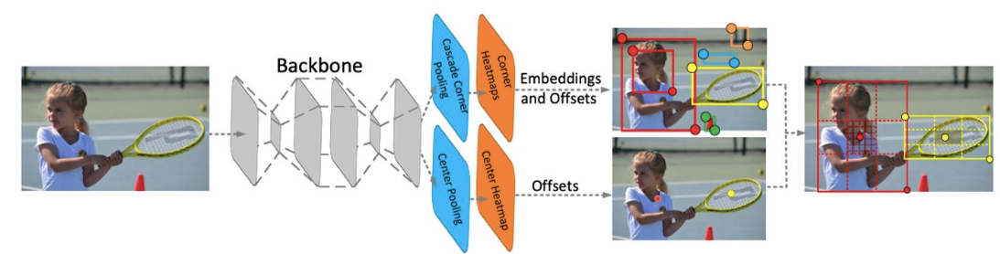

#### 4.5.5 FCOS
- 每个像素回归一个4D向量指代预测框相对于当前像素位置的偏移，如图左
- 使用FPN预测不同尺寸的目标题。
- 由于预测的结果会产生许多低质量的预测结果，采用center-ness分支来预测当前像素与对应目标中心点的偏离情况，用来去除低质量预测结果以及进行NMS

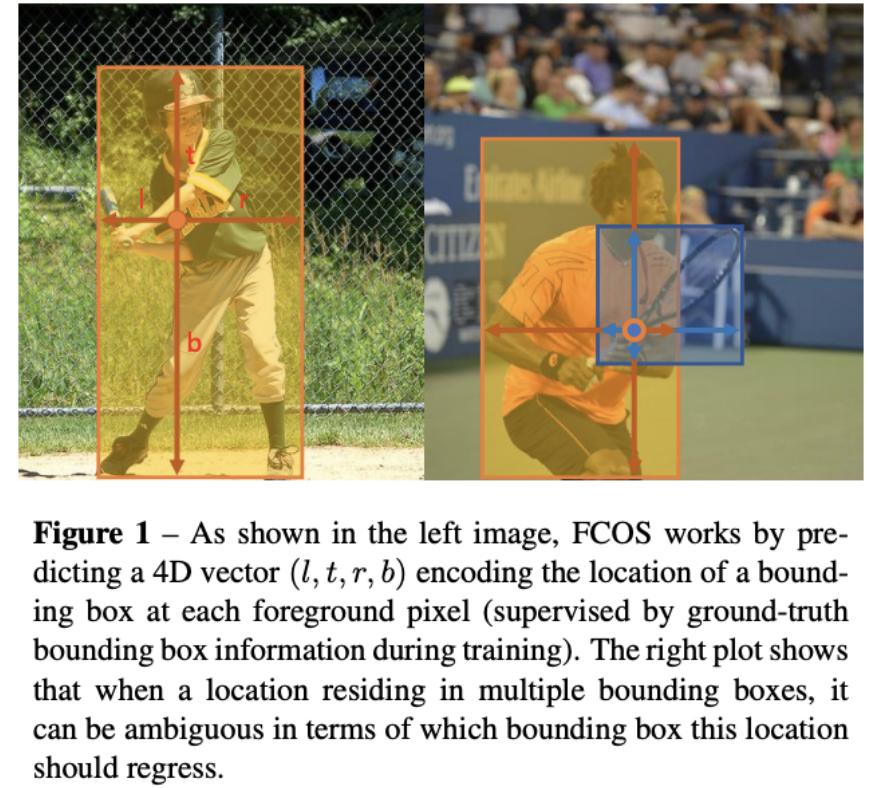

**FCOS网络架构**

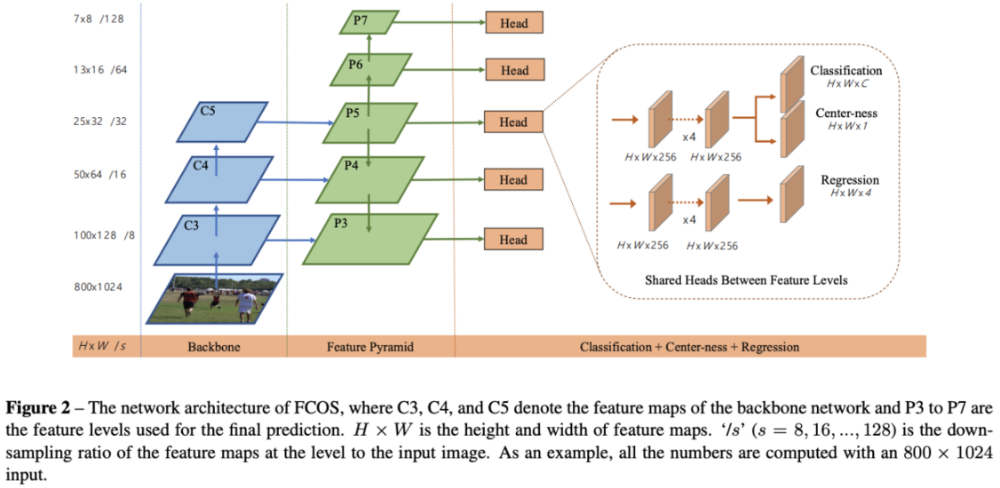